# **CAM tutorial with pretrained YOLO model**

Привет, друзья!  
В этом туториале вы научитесь использовать карты активации классов (Class Activation Maps, CAM) для анализа работы модели YOLO NAS S. Мы разберём, как интерпретировать решения модели, что поможет вам понять, какие признаки извлекает модель и на каких областях изображения она фокусируется.  

### **Почему это важно?**  
Объяснимый ИИ (Explainable AI) позволяет не только разрабатывать более прозрачные и надёжные модели, но и уверенно применять их в бизнесе, где цена ошибки высока. Моя цель — создать несколько (как можно больше) практических руководств для применения XAI в вашей работе.


### **В процессе туториала, вы узнаете:**  
- Как загрузить и протестировать YOLO NAS S с помощью библиотеки `super-gradients`.  
- Как создать карты активации классов (CAM) с нуля, без готовых библиотек.  
- Как анализировать работу модели: извлечение признаков в `backbone` и их обработку в `heads`.  
- Где применять CAM для улучшения работы моделей в реальных задачах.  


### **Будем использовать:**
**Yolo-framework:** `super-gradients` [](https://github.com/Deci-AI/super-gradients) \
**XAI-framework for CAM:** without — from scratch \
**Github:** https://github.com/SadSabrina/XAI-open_materials/tree/main

###**План:**  
1. Подготовка и загрузка модели YOLO NAS S.
2. Извлечение карт активации классов (CAM) с нуля.  
3. Анализ работы модели: что извлекает `backbone`, что делает `head`.
4. Выводы и потенциальные применения в реальном мире.



In [1]:
!pip install -U git+https://github.com/Deci-AI/super-gradients@e0ccacf8868ffa1296fa4f8407c03d2bc227312c -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [3]:
# некоторые настройки в библиотеке, следуя https://github.com/Deci-AI/super-gradients/issues/2057

file_path = "/usr/local/lib/python3.11/dist-packages/super_gradients/training/pretrained_models.py"

with open(file_path, "r") as file:
    content = file.read()

content = content.replace("sghub.deci.ai", "sg-hub-nv.s3.amazonaws.com")

with open(file_path, "w") as file:
    file.write(content)

print(f"Modified {file_path}")



file_path = "/usr/local/lib/python3.11/dist-packages/super_gradients/training/utils/checkpoint_utils.py"

with open(file_path, "r") as file:
    content = file.read()

content = content.replace("sghub.deci.ai", "sg-hub-nv.s3.amazonaws.com")

with open(file_path, "w") as file:
    file.write(content)

print(f"Modified {file_path}")


Modified /usr/local/lib/python3.11/dist-packages/super_gradients/training/pretrained_models.py
Modified /usr/local/lib/python3.11/dist-packages/super_gradients/training/utils/checkpoint_utils.py



# **1. Object detection**

Для получения базовых прогнозов и их тепловых карт будем использовать:
1. Предобученную YOLO NAS S  на наборе данных [COCO](https://cocodataset.org/#home);
2. Небольшой тестовый датасет;

Сначала загрузим всё и соберем результаты.

In [4]:
from super_gradients.training import models
from super_gradients.common.object_names import Models
import numpy as np
import requests
import matplotlib.pyplot as plt
from torch.nn import functional as F
from PIL import Image
import cv2
import torch
import requests
import ast
import os
from torchvision import transforms

The console stream is logged into /root/sg_logs/console.log


[2025-01-25 09:35:15] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2025-01-25 09:35:18] INFO - utils.py - NumExpr defaulting to 2 threads.
/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
[2025-01-25 09:35:23] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command


Будем использовать модель, обученную на наборе данных COCO. Модель может обнаруживать до 80 категорий объектов, таких как люди, автомобили, животные и т.д.

In [5]:
model = models.get(Models.YOLO_NAS_S, pretrained_weights="coco")
model.eval();

[2025-01-25 09:35:27] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2025-01-25 09:35:27] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sg-hub-nv.s3.amazonaws.com/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:02<00:00, 26.9MB/s]
[2025-01-25 09:35:31] I

In [1]:
!wget https://github.com/SadSabrina/XAI-open_materials/raw/refs/heads/main/yolo_nas_cam_tutorial/coco_test/coco_test.zip

--2025-01-24 15:25:25--  https://github.com/SadSabrina/XAI-open_materials/raw/refs/heads/main/yolo_nas_cam_tutorial/coco_test/coco_test.zip
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/SadSabrina/XAI-open_materials/refs/heads/main/yolo_nas_cam_tutorial/coco_test/coco_test.zip [following]
--2025-01-24 15:25:26--  https://raw.githubusercontent.com/SadSabrina/XAI-open_materials/refs/heads/main/yolo_nas_cam_tutorial/coco_test/coco_test.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17277154 (16M) [application/zip]
Saving to: ‘coco_test.zip’

coco_test.zip       100%[===================>]  16

In [2]:
!unzip '/content/coco_test.zip'

Archive:  /content/coco_test.zip
   creating: yolo_nas_cam_tutorial/coco_test/
  inflating: yolo_nas_cam_tutorial/coco_test/sheep.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/bird.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/cow.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/cat.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/giraffe.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/horses.jpg  
  inflating: yolo_nas_cam_tutorial/coco_test/bear.jpg  


In [12]:
image_dir = "/content/yolo_nas_cam_tutorial/coco_test/"
files = os.listdir(image_dir)

print(f"Количество изображений в тестовом наборе: {len(files)}")

Количество изображений в тестовом наборе: 7


Теперь выберем одно изображение из набора данных, преобразуем его в нужный формат и визуализируем.

Важно учесть, что согласно документации библиотеки `super-gradients` на вход `model.predict()` нужно подавать ненормализованное изображение, поэтому достаточно отдавать ненормализованные изображения с разрешением `640×640`.

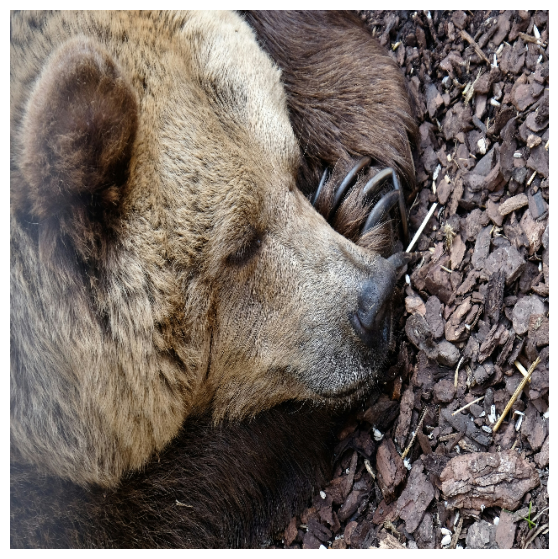

In [13]:
img = np.array(Image.open(image_dir+files[5]))
img = cv2.resize(img, (640, 640))

transform = transforms.ToTensor() # если необходимо перевести картинку в тензор
tensor = transform(img).unsqueeze(0)

fig = plt.figure(figsize=(7, 7))
plt.imshow(img)
plt.axis('off');

# **CAM: теория**

В качестве вспомогательного инструмента для оценки обработки данных модели, будем использовать Class Activation Maps (CAM). Class Activation Maps (CAM) — это инструмент, который позволяет визуализировать, какие области изображения наиболее важны для модели при принятии решения.

 Построение CAM проводится по формуле:

$$CAM_k = w^c_kA^k$$

где:
- $A^k$ — карта активации модели для $k$-го класса на последнем сверточном слое (осуществляющем классификацию);
- w^c_k — веса, соответствующие $k-$му классу, взятые из выходного слоя классификатора;

Обычно, CAM строится по последнему слою CNN, слою перед Global Average Pooling. Но так как у нас иная архитектура, слой выбираем иным образом.




# **Выбор слоя**

Архитектура моделей YOLO NAS (You Only Look Once) включает в себя части `backbone`, `head` (головы) и `neck` (шеи).

1. Задача `backbone` — извлечение признаков и особенностей изображения.

2. Задача backbone — извлечение признаков и особенностей изображения.

3. Задача head — "принять решение" о том, какой объект присутствует на изображении (классификация), а также вычислить координаты и размеры ограничивающих рамок (локализация).

Чтобы посмотреть всю архитектуру сети, достаточно выполнить команду:
`model`. Чтобы обратиться к какой либо части, указать её название через `.`:

- `model.backbone`
- `model.neck`
- `model.heads`


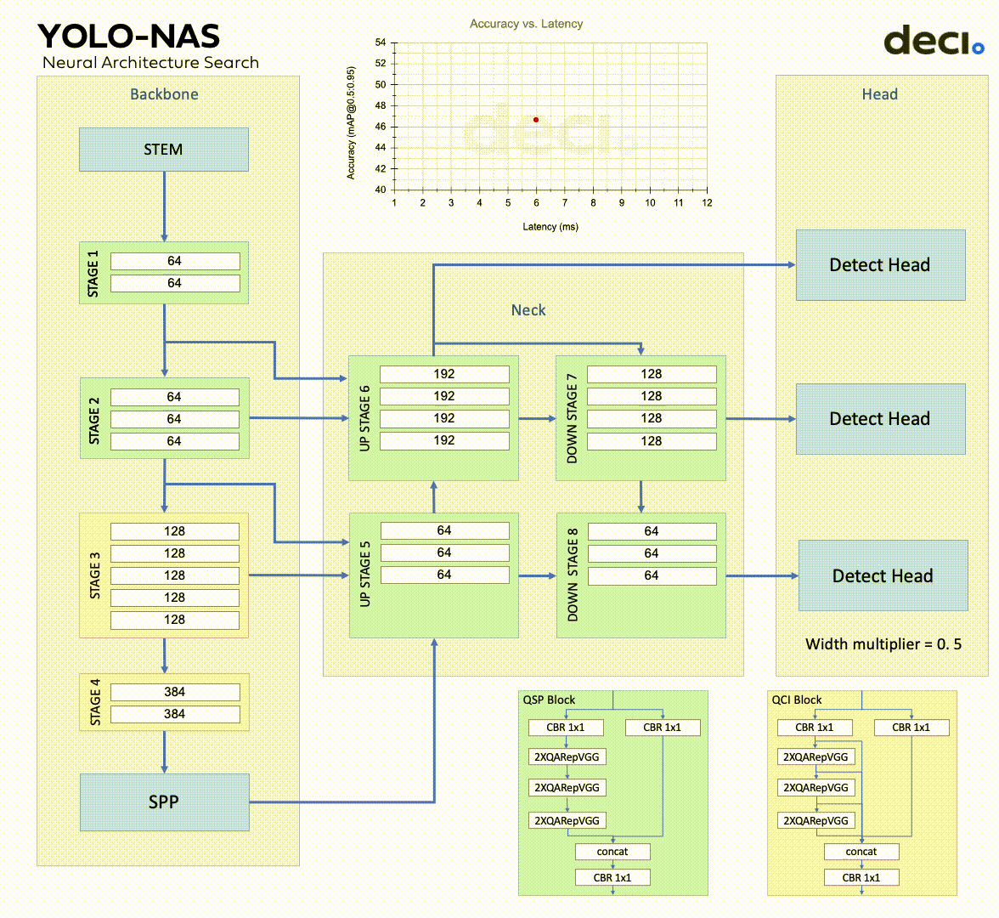

В рамках построения карт посмотрим:
- какие карты сверток модель получает на выходе из различных этапов `backbone`, чтобы посмотреть на признаки
- как признаки отвечают за прогноз в `heads` — головах. На них и построим карты активации классов (CAM).

**Примчеание 1:**

🐻 Сами CAM по определнию строим именно на головах, так как из них можно извлечь веса, которые добавляются к прогнозу и отвечают за конкретный класс.  Для `backbone` просто визуализируем активации.

**Примчеание 2:**

🐻 У каждой головы есть блок `cls_convs` — отвечающий за свертки классификации и `cls_pred` — за прогноз. С них будем извлекать свертки и веса класса соответственно.

In [ ]:
# model.backbone

In [ ]:
# model.heads

Также выпишим индексы true классов всего тестового датасета и сохраним все. Они нам ещё понадобятся.

**Индексы классов:**

- bear — 22
- bird — 15
- cat — 16
- cow — 20
- giraffe  24
- horse — 18
- sheep — 19

In [ ]:
all_classes = requests.get('https://github.com/SadSabrina/XAI-open_materials/raw/refs/heads/main/yolo_nas_cam_tutorial/ms_coco_classnames.txt').text

all_classes = all_classes.replace("u'", "'")
all_classes = ast.literal_eval(all_classes)

print(all_classes)

{0: '__background__', 1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light', 11: 'fire hydrant', 12: 'stop sign', 13: 'parking meter', 14: 'bench', 15: 'bird', 16: 'cat', 17: 'dog', 18: 'horse', 19: 'sheep', 20: 'cow', 21: 'elephant', 22: 'bear', 23: 'zebra', 24: 'giraffe', 25: 'backpack', 26: 'umbrella', 27: 'handbag', 28: 'tie', 29: 'suitcase', 30: 'frisbee', 31: 'skis', 32: 'snowboard', 33: 'sports ball', 34: 'kite', 35: 'baseball bat', 36: 'baseball glove', 37: 'skateboard', 38: 'surfboard', 39: 'tennis racket', 40: 'bottle', 41: 'wine glass', 42: 'cup', 43: 'fork', 44: 'knife', 45: 'spoon', 46: 'bowl', 47: 'banana', 48: 'apple', 49: 'sandwich', 50: 'orange', 51: 'broccoli', 52: 'carrot', 53: 'hot dog', 54: 'pizza', 55: 'donut', 56: 'cake', 57: 'chair', 58: 'couch', 59: 'potted plant', 60: 'bed', 61: 'dining table', 62: 'toilet', 63: 'tv', 64: 'laptop', 65: 'mouse', 66: 'remote', 67: 'keyboard', 68: 'ce

# **Анализ backbones**

Для извлечения карт используем `Hook`.

`Hook` — это метод PyTorch, который позволяет "подключаться" к слоям сети для извлечения информации (например, выходных активаций или градиентов).
Основные возможности Hook:

- Перехват выходов слоя при прямом проходе (forward hook).
- Возможность изменять или анализировать градиенты при обратном проходе (backward hook).

In [ ]:
# Простой класс Hook
class Hook():
    def __init__(self, m):
      self.hook = m.register_forward_hook(self.hook_func) #цепляемся за forward проход слоя m, переданного при инициализации

    def hook_func(self, module, input, output):
     # self.features = ((output.cpu()).data).numpy()
      self.features = output.detach().cpu().numpy()  #получаем output слоя и преобразуем в numpy массив

    def remove(self):
      self.hook.remove()

Выпишем части, с которых будем перехватывать карты. По постановке — соберем признаки из каждого `stage` YOLO. Для каждого `stage` перехватим результат последней свертки.

In [ ]:
stage1_layer = model.backbone.stage1.blocks._modules['bottlenecks']._modules['1'].cv2._modules['branch_1x1']
stage2_layer = model.backbone.stage2.blocks._modules['bottlenecks']._modules['1'].cv2._modules['branch_1x1']
stage3_layer = model.backbone.stage3.blocks._modules['bottlenecks']._modules['1'].cv2._modules['branch_1x1']
stage4_layer = model.backbone.stage4.blocks._modules['bottlenecks']._modules['1'].cv2._modules['branch_1x1']

for layer in [stage1_layer, stage2_layer, stage3_layer, stage4_layer]:
  print(layer)

Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
Conv2d(96, 96, kernel_size=(1, 1), stride=(1, 1))
Conv2d(192, 192, kernel_size=(1, 1), stride=(1, 1))


In [ ]:
model.backbone.stage4.blocks._modules['bottlenecks']._modules['1'].cv2._modules['branch_1x1']

Conv2d(192, 192, kernel_size=(1, 1), stride=(1, 1))

Чтобы получить карты, достаточно пропустить изображение через модель.

In [ ]:
act_maps_stage1 = Hook(stage1_layer)
act_maps_stage2 = Hook(stage2_layer)
act_maps_stage3 = Hook(stage3_layer)
act_maps_stage4 = Hook(stage4_layer)

result = model.predict(img, fuse_model=False, conf=0.8)

act_maps_stage1.remove()
act_maps_stage2.remove()
act_maps_stage3.remove()
act_maps_stage4.remove()

/usr/local/lib/python3.11/dist-packages/super_gradients/training/pipelines/pipelines.py:223: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with eval_mode(self.model), torch.no_grad(), torch.cuda.amp.autocast(enabled=self.fp16):


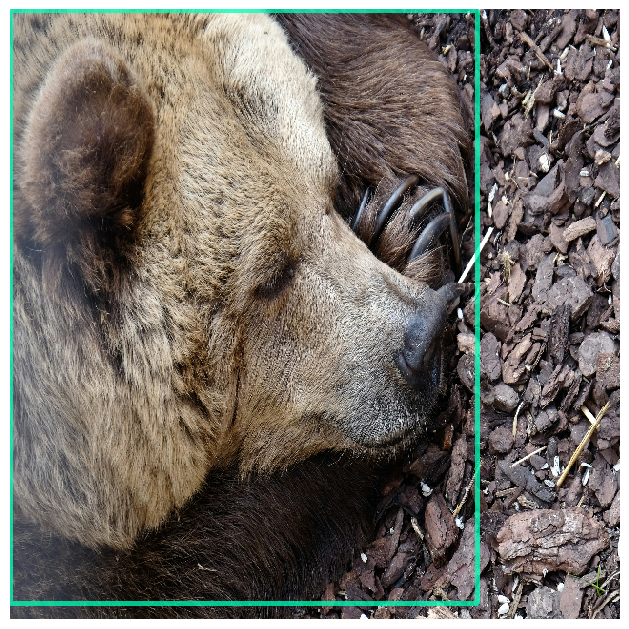

In [ ]:
result.show()

In [ ]:
predicted_idx = result.prediction.labels

print(f'Model prediction: {[result.class_names[i] for i in predicted_idx]}')

Model prediction: ['bear']


Модель справилась с задачей! Построим извлеченные свертки.

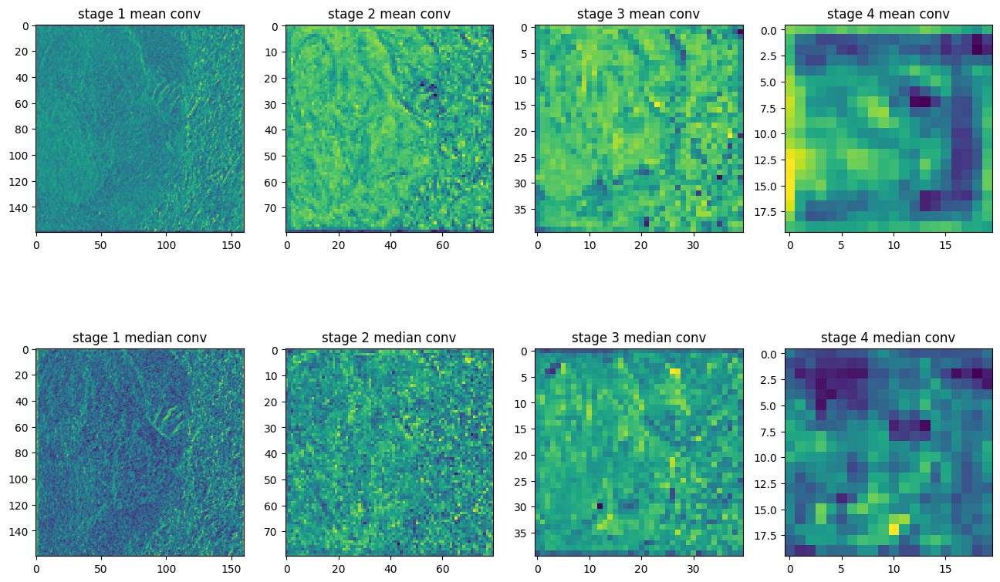

In [ ]:
fig_original_stages, ax_original_stages = plt.subplots(2, 4, figsize=(16, 10))

# Mean activations
ax_original_stages[0, 0].imshow(np.mean(act_maps_stage1.features[0], axis=0))
ax_original_stages[0, 0].set_title('stage 1 mean conv')

ax_original_stages[0, 1].imshow(np.mean(act_maps_stage2.features[0], axis=0))
ax_original_stages[0, 1].set_title('stage 2 mean conv')

ax_original_stages[0, 2].imshow(np.mean(act_maps_stage3.features[0], axis=0))
ax_original_stages[0, 2].set_title('stage 3 mean conv')

ax_original_stages[0, 3].imshow(np.mean(act_maps_stage4.features[0], axis=0))
ax_original_stages[0, 3].set_title('stage 4 mean conv')

# Median activations
ax_original_stages[1, 0].imshow(np.median(act_maps_stage1.features[0], axis=0))
ax_original_stages[1, 0].set_title('stage 1 median conv')

ax_original_stages[1, 1].imshow(np.median(act_maps_stage2.features[0], axis=0))
ax_original_stages[1, 1].set_title('stage 2 median conv')

ax_original_stages[1, 2].imshow(np.median(act_maps_stage3.features[0], axis=0))
ax_original_stages[1, 2].set_title('stage 3 median conv')

ax_original_stages[1, 3].imshow(np.median(act_maps_stage4.features[0], axis=0))
ax_original_stages[1, 3].set_title('stage 4 median conv');

**Наблюдения:**
- Медианные и средние значения активаций различаются по силе. Значит, фильтры свертки неравномерно обращают внимание на разные признаки на данном этапе.
- Чем дальше `stage` тем более крупные части изображения анализируются.

# **Анализ heads**

Теперь построим CAM интересущего класса (22). Извлекать будем последний сверточный слой перед классификацией с каждой из трех голов. Каждая голова выдает свертку разного размера. Они выписаны в коде после `#`

In [ ]:
# Слои для извлечения сверток
final_layer_head3 = model.heads.head3.cls_convs._modules['0']._modules['seq'][0] #256, 20, 20
final_layer_head2 = model.heads.head2.cls_convs._modules['0']._modules['seq'][0] # 128 40, 40
final_layer_head1 = model.heads.head1.cls_convs._modules['0']._modules['seq'][0] # 128 40, 40

# Слои для извлечения весов
weights_interested_head3 = model.heads.head3.cls_pred.weight[23, :].cpu().data.numpy()
weights_interested_head2 = model.heads.head2.cls_pred.weight[23, :].cpu().data.numpy()
weights_interested_head1 = model.heads.head1.cls_pred.weight[23, :].cpu().data.numpy()

In [ ]:
act_maps_head3 = Hook(final_layer_head3)
act_maps_head2 = Hook(final_layer_head2)
act_maps_head1 = Hook(final_layer_head1)

results = model.predict(img, fuse_model=False)

act_maps_head3.remove()
act_maps_head2.remove()
act_maps_head1.remove()

In [ ]:
act_maps_head3.features[0].shape, act_maps_head2.features[0].shape, act_maps_head1.features[0].shape

((256, 20, 20), (128, 40, 40), (64, 80, 80))

In [ ]:
cam_head3 = weights_interested_head3.reshape(256).dot(act_maps_head3.features[0].reshape((256, 20*20)))
cam_head2 = weights_interested_head2.reshape(128).dot(act_maps_head2.features[0].reshape((128, 40*40)))
cam_head1 = weights_interested_head1.reshape(64).dot(act_maps_head1.features[0].reshape((64, 80*80)))

cam_head3 = cam_head3.reshape((20,20))
cam_head2 = cam_head2.reshape((40,40))
cam_head1 = cam_head1.reshape((80,80))

cam1_tensor = torch.from_numpy(cam_head1).float().unsqueeze(0).unsqueeze(0)  # Преобразовываем обратно в тензор
interpol_head1 = F.interpolate(cam1_tensor, (640, 640), mode="bilinear").squeeze(0).squeeze(0)
cam2_tensor = torch.from_numpy(cam_head2).float().unsqueeze(0).unsqueeze(0)
interpol_head2 = F.interpolate(cam2_tensor, (640, 640), mode="bilinear").squeeze(0).squeeze(0)
cam3_tensor = torch.from_numpy(cam_head3).float().unsqueeze(0).unsqueeze(0)
interpol_head3 = F.interpolate(cam3_tensor, (640, 640), mode="bilinear").squeeze(0).squeeze(0)

(-0.5, 19.5, 19.5, -0.5)

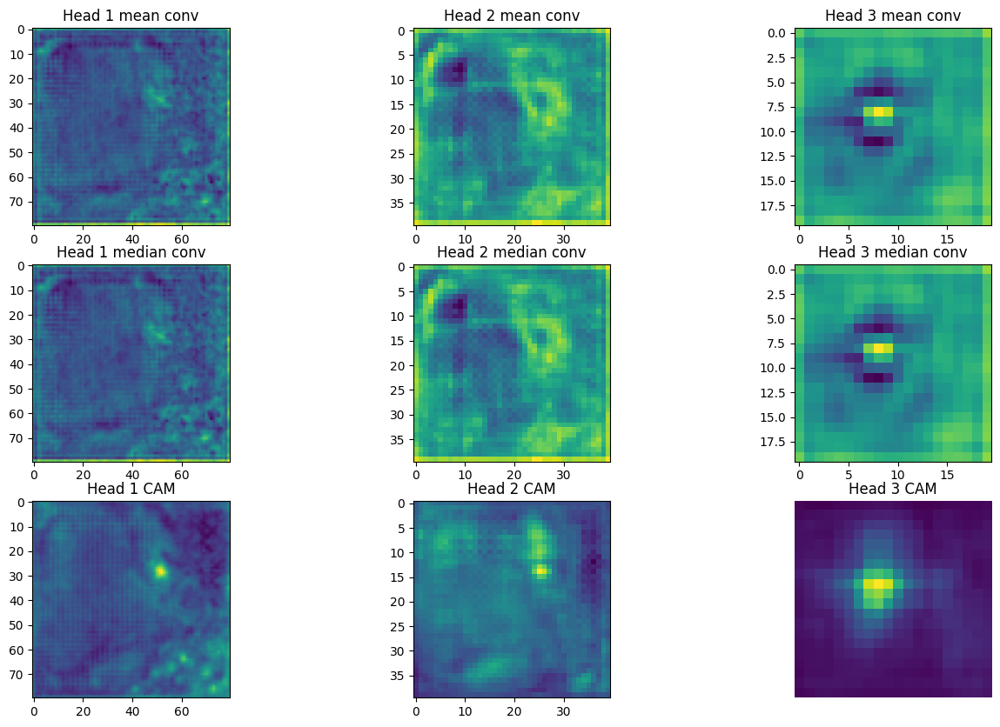

In [ ]:
fig_original_CAM, ax_original_CAM = plt.subplots(3, 3, figsize=(16, 10))

# Mean activations
ax_original_CAM[0, 0].imshow(np.mean(act_maps_head1.features[0], axis=0))
ax_original_CAM[0, 0].set_title('Head 1 mean conv')

ax_original_CAM[0, 1].imshow(np.mean(act_maps_head2.features[0], axis=0))
ax_original_CAM[0, 1].set_title('Head 2 mean conv')

ax_original_CAM[0, 2].imshow(np.mean(act_maps_head3.features[0], axis=0))
ax_original_CAM[0, 2].set_title('Head 3 mean conv')


# Median activations
ax_original_CAM[1, 0].imshow(np.mean(act_maps_head1.features[0], axis=0))
ax_original_CAM[1, 0].set_title('Head 1 median conv')

ax_original_CAM[1, 1].imshow(np.mean(act_maps_head2.features[0], axis=0))
ax_original_CAM[1, 1].set_title('Head 2 median conv')

ax_original_CAM[1, 2].imshow(np.mean(act_maps_head3.features[0], axis=0))
ax_original_CAM[1, 2].set_title('Head 3 median conv')

# CAMs

ax_original_CAM[2, 0].imshow(cam_head1)
ax_original_CAM[2, 0].set_title('Head 1 CAM')

ax_original_CAM[2, 1].imshow(cam_head2)
ax_original_CAM[2, 1].set_title('Head 2 CAM')

ax_original_CAM[2, 2].imshow(cam_head3)
ax_original_CAM[2, 2].set_title('Head 3 CAM');

plt.axis('off')

**Наблюдения**
- Каждая следующая голова выделяет признаки более "большие", чем предыдущие (аналогично `stages`)
- Средние и медианные значения сверток близки, что позволяет выдвинуть гипотезу о стабилизации признаков, которые выделяют фильтры.

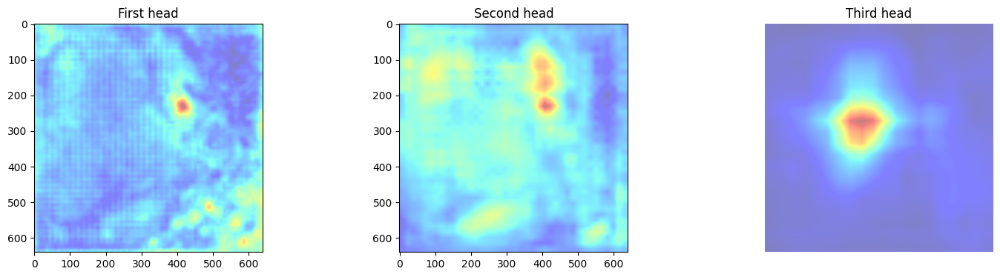

In [ ]:
fig_original_interpol, ax_original_interpol = plt.subplots(1, 3, figsize=(18, 4))

ax_original_interpol[0].imshow(interpol_head1, alpha=0.5, cmap='jet');
ax_original_interpol[0].set_title('First head')

ax_original_interpol[1].imshow(interpol_head2, alpha=0.5, cmap='jet');
ax_original_interpol[1].set_title('Second head')

ax_original_interpol[2].imshow(interpol_head3, alpha=0.5, cmap='jet');
ax_original_interpol[2].set_title('Third head')
plt.axis('off');

# **Что можно делать с картами активации? Анализ устойчивости модели.**

Извлечение карт активаций само по себе — не только увлекательный теоретический процесс анализа распространения признаков в изображении. На основе карт можно анализировать, как различные вмешательства (например, добавление шума) влияют на извлекаемые признаки на разных частях модели. В свою очередь, это позволяет сделать выводы об устойчивости и построить гипотезы по улучшению модели.


В качестве посмотрим, как на активации повлияет случайный шум.

(-0.5, 639.5, 639.5, -0.5)

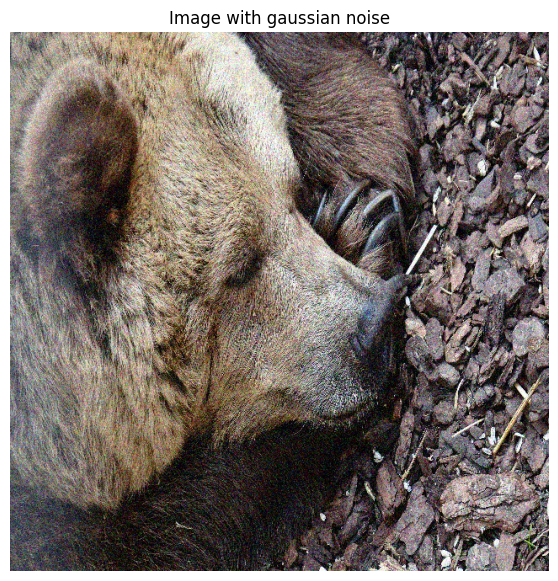

In [ ]:
torch.manual_seed(42)

def add_gaussian_noise(image_tensor, mean=0.0, std=0.1):
    """Добавляет гауссовский шум к изображению."""
    noise = torch.normal(mean=mean, std=std, size=image_tensor.shape)
    noisy_image = image_tensor + noise

    noisy_tensor = torch.clamp(noisy_image, 0.0, 1.0)
    to_pil = transforms.ToPILImage()
    noisy_image = to_pil(noisy_tensor[0])

    return noisy_tensor, noisy_image

noisy_tensor, noisy_image = add_gaussian_noise(tensor)

fig = plt.figure(figsize=(7, 7))
plt.imshow(noisy_image)
plt.title('Image with gaussian noise')

plt.axis('off')

Снова повторим весь процесс извлечения карт.

In [ ]:
# Stages
act_maps_stage1_noisy = Hook(stage1_layer)
act_maps_stage2_noisy = Hook(stage2_layer)
act_maps_stage3_noisy = Hook(stage3_layer)
act_maps_stage4_noisy = Hook(stage4_layer)

# Heads
act_maps_head3_noisy = Hook(final_layer_head3)
act_maps_head2_noisy = Hook(final_layer_head2)
act_maps_head1_noisy = Hook(final_layer_head1)

# Prediction
result = model.predict(noisy_image, fuse_model=False, conf=0.5)

# remove
act_maps_stage1_noisy.remove()
act_maps_stage2_noisy.remove()
act_maps_stage3_noisy.remove()
act_maps_stage4_noisy.remove()

act_maps_head3_noisy.remove()
act_maps_head2_noisy.remove()
act_maps_head1_noisy.remove()

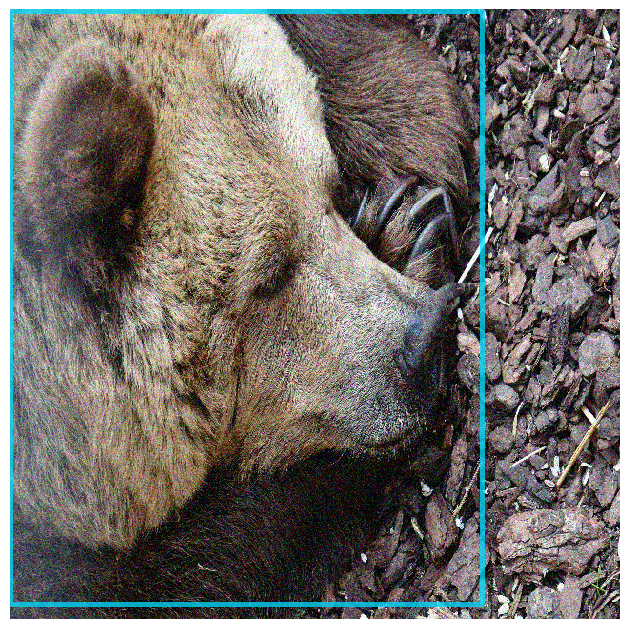

In [ ]:
result.show()

In [ ]:
predicted_idx = result.prediction.labels

print(f'Model prediction: {[result.class_names[i] for i in predicted_idx]}')

Model prediction: ['cat']


Прогноз модели изменился, причем значимо. Также пришлось понизить "уровень доверия" `conf` c 0.8 до 0.5, что говорит об изменении внутренней обработки изображения. Для детального анализа, посмотрим, на карты.

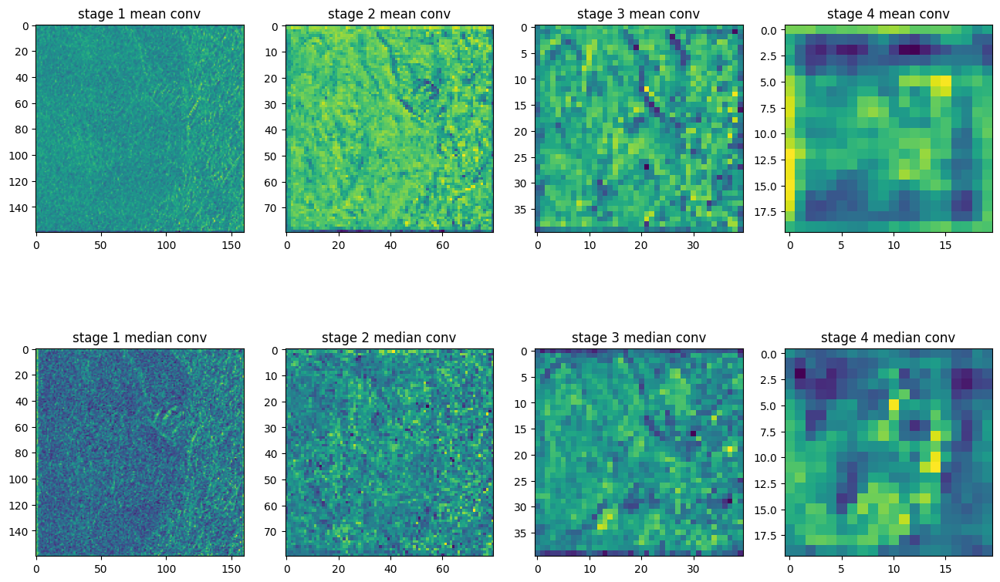

In [ ]:
fig_noisy_stages, ax_noisy_stages = plt.subplots(2, 4, figsize=(16, 10))

# Mean activations
ax_noisy_stages[0, 0].imshow(np.mean(act_maps_stage1_noisy.features[0], axis=0))
ax_noisy_stages[0, 0].set_title('stage 1 mean conv')

ax_noisy_stages[0, 1].imshow(np.mean(act_maps_stage2_noisy.features[0], axis=0))
ax_noisy_stages[0, 1].set_title('stage 2 mean conv')

ax_noisy_stages[0, 2].imshow(np.mean(act_maps_stage3_noisy.features[0], axis=0))
ax_noisy_stages[0, 2].set_title('stage 3 mean conv')

ax_noisy_stages[0, 3].imshow(np.mean(act_maps_stage4_noisy.features[0], axis=0))
ax_noisy_stages[0, 3].set_title('stage 4 mean conv')

# Median activations
ax_noisy_stages[1, 0].imshow(np.median(act_maps_stage1_noisy.features[0], axis=0))
ax_noisy_stages[1, 0].set_title('stage 1 median conv')

ax_noisy_stages[1, 1].imshow(np.median(act_maps_stage2_noisy.features[0], axis=0))
ax_noisy_stages[1, 1].set_title('stage 2 median conv')

ax_noisy_stages[1, 2].imshow(np.median(act_maps_stage3_noisy.features[0], axis=0))
ax_noisy_stages[1, 2].set_title('stage 3 median conv')

ax_noisy_stages[1, 3].imshow(np.median(act_maps_stage4_noisy.features[0], axis=0))
ax_noisy_stages[1, 3].set_title('stage 4 median conv');

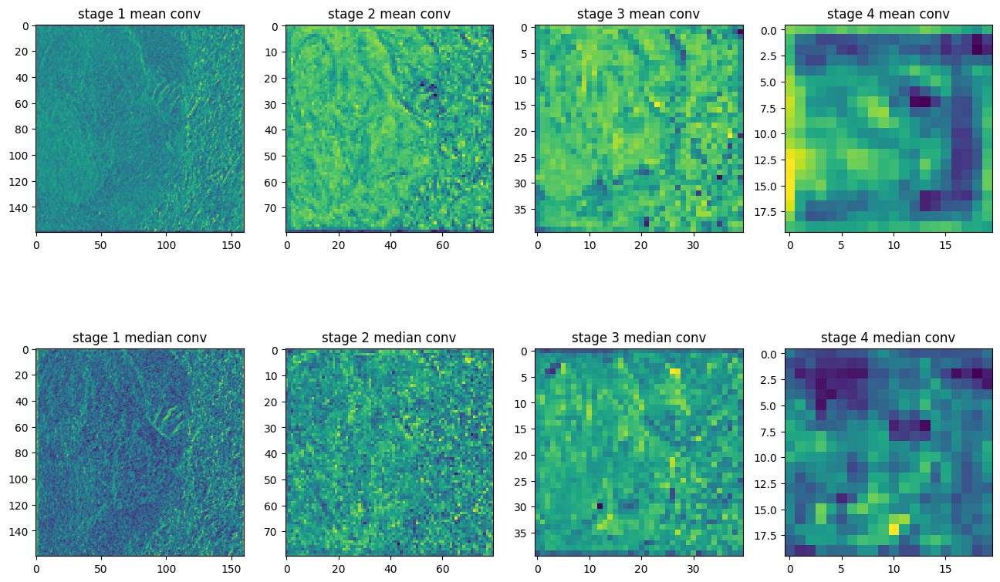

In [ ]:
fig_original_stages

**Наблюдения:**
- Для зашумленного изображения `stage2`, `stage3` четче выделяют контуры медведя
- Для оригинального и шумного изображения `stage4` локализуют "внимание" на разных областях, что видно на медианах сверток.

Но чтобы ориентироваться не только на визуальную информацию, посмотрим на расстояния между:

- оригинальным и шумным изображением
- оригинальными и шумными свертками

In [ ]:
images_difference = torch.mean(np.abs(tensor - noisy_tensor))

stages_difference = np.array([np.mean(np.abs(act_maps_stage1_noisy.features[0] - act_maps_stage1.features[0])),
                              np.mean(np.abs(act_maps_stage2_noisy.features[0] - act_maps_stage2.features[0])),
                              np.mean(np.abs(act_maps_stage3_noisy.features[0] - act_maps_stage3.features[0])),
                              np.mean(np.abs(act_maps_stage4_noisy.features[0] - act_maps_stage4.features[0]))])

print(f'tensor images distance:{images_difference} \n stages distances:{stages_difference}')

tensor images distance:0.07590668648481369 
 stages distances:[0.0151292  0.00553082 0.00164603 0.00066394]


Наиболее сильное расстояние для `stage 1`.

Проанализируем CAM.

In [ ]:
cam_head3_noisy = weights_interested_head3.reshape(256).dot(act_maps_head3_noisy.features[0].reshape((256, 20*20)))
cam_head2_noisy = weights_interested_head2.reshape(128).dot(act_maps_head2_noisy.features[0].reshape((128, 40*40)))
cam_head1_noisy = weights_interested_head1.reshape(64).dot(act_maps_head1_noisy.features[0].reshape((64, 80*80)))

cam_head3_noisy = cam_head3_noisy.reshape((20,20))
cam_head2_noisy = cam_head2_noisy.reshape((40,40))
cam_head1_noisy = cam_head1_noisy.reshape((80,80))

cam1_tensor_noisy = torch.from_numpy(cam_head1_noisy).float().unsqueeze(0).unsqueeze(0)  # Преобразовываем обратно в тензор
interpol_head1 = F.interpolate(cam1_tensor_noisy, (640, 640), mode="bilinear").squeeze(0).squeeze(0)

cam2_tensor_noisy = torch.from_numpy(cam_head2_noisy).float().unsqueeze(0).unsqueeze(0)  # Преобразовываем обратно в тензор
interpol_head2 = F.interpolate(cam2_tensor_noisy, (640, 640), mode="bilinear").squeeze(0).squeeze(0)

cam3_tensor_noisy = torch.from_numpy(cam_head3_noisy).float().unsqueeze(0).unsqueeze(0)  # Преобразовываем обратно в тензор
interpol_head3 = F.interpolate(cam3_tensor_noisy, (640, 640), mode="bilinear").squeeze(0).squeeze(0)

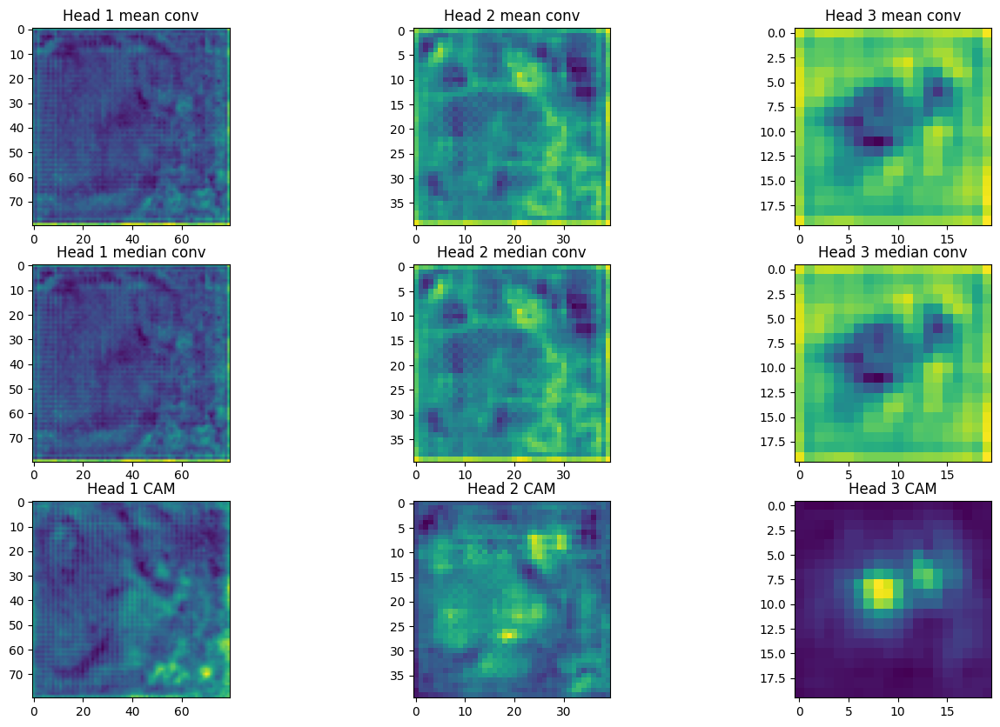

In [ ]:
fig_noisy_heads, ax_noisy_heads = plt.subplots(3, 3, figsize=(16, 10))

# Mean activations
ax_noisy_heads[0, 0].imshow(np.mean(act_maps_head1_noisy.features[0], axis=0))
ax_noisy_heads[0, 0].set_title('Head 1 mean conv')

ax_noisy_heads[0, 1].imshow(np.mean(act_maps_head2_noisy.features[0], axis=0))
ax_noisy_heads[0, 1].set_title('Head 2 mean conv')

ax_noisy_heads[0, 2].imshow(np.mean(act_maps_head3_noisy.features[0], axis=0))
ax_noisy_heads[0, 2].set_title('Head 3 mean conv')


# Median activations
ax_noisy_heads[1, 0].imshow(np.mean(act_maps_head1_noisy.features[0], axis=0))
ax_noisy_heads[1, 0].set_title('Head 1 median conv')

ax_noisy_heads[1, 1].imshow(np.mean(act_maps_head2_noisy.features[0], axis=0))
ax_noisy_heads[1, 1].set_title('Head 2 median conv')

ax_noisy_heads[1, 2].imshow(np.mean(act_maps_head3_noisy.features[0], axis=0))
ax_noisy_heads[1, 2].set_title('Head 3 median conv')

# CAMs

ax_noisy_heads[2, 0].imshow(cam_head1_noisy)
ax_noisy_heads[2, 0].set_title('Head 1 CAM')

ax_noisy_heads[2, 1].imshow(cam_head2_noisy)
ax_noisy_heads[2, 1].set_title('Head 2 CAM')

ax_noisy_heads[2, 2].imshow(cam_head3_noisy)
ax_noisy_heads[2, 2].set_title('Head 3 CAM');

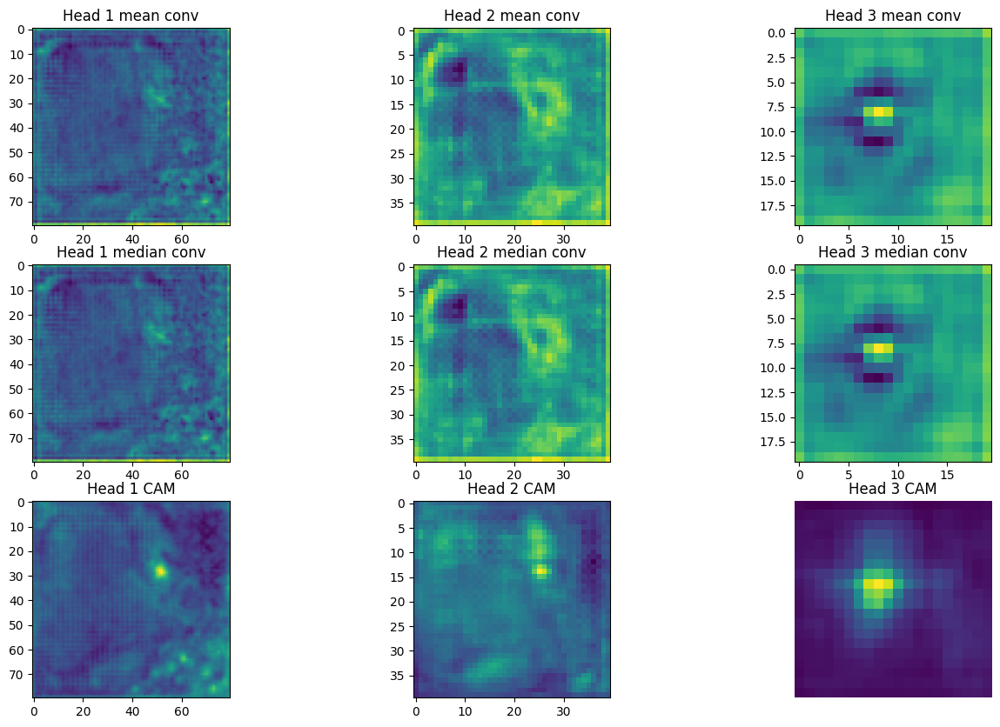

In [ ]:
fig_original_CAM

**Наблюдения:**
- Локализации голов 3, 2 и 1, построенные по CAM различны

Также посмотрим на расстояния.

In [ ]:
heads_difference = np.array([np.mean(np.abs(act_maps_head1_noisy.features[0] - act_maps_head1.features[0])),
                              np.mean(np.abs(act_maps_head2_noisy.features[0] - act_maps_head2.features[0])),
                              np.mean(np.abs(act_maps_head3_noisy.features[0] - act_maps_head3.features[0]))])

print(f'tensor images distance:{images_difference} \n heads distances:{heads_difference}')

tensor images distance:0.07590668648481369 
 heads distances:[0.05898389 0.03556892 0.03109205]


Расстояния тоже малы, но также наибольшее у 1й головы. Хотя порядок различия (сотые) сильнее, чем в `stages`.

In [ ]:
[images_difference]*4 / stages_difference, [images_difference]*3 / heads_difference

(array([  5.0172296,  13.724298 ,  46.115147 , 114.32828  ], dtype=float32),
 array([1.2869054, 2.1340733, 2.4413536], dtype=float32))

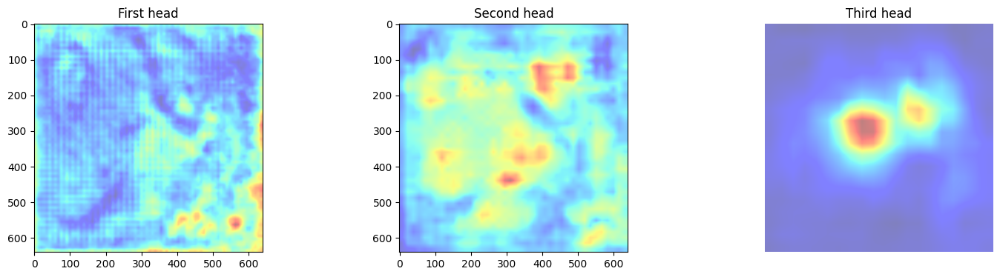

In [ ]:
fig_noisy_interpol, ax_noisy_interpol = plt.subplots(1, 3, figsize=(18, 4))

ax_noisy_interpol[0].imshow(interpol_head1, alpha=0.5, cmap='jet');
ax_noisy_interpol[0].set_title('First head')

ax_noisy_interpol[1].imshow(interpol_head2, alpha=0.5, cmap='jet');
ax_noisy_interpol[1].set_title('Second head')

ax_noisy_interpol[2].imshow(interpol_head3, alpha=0.5, cmap='jet');
ax_noisy_interpol[2].set_title('Third head')

plt.axis('off');

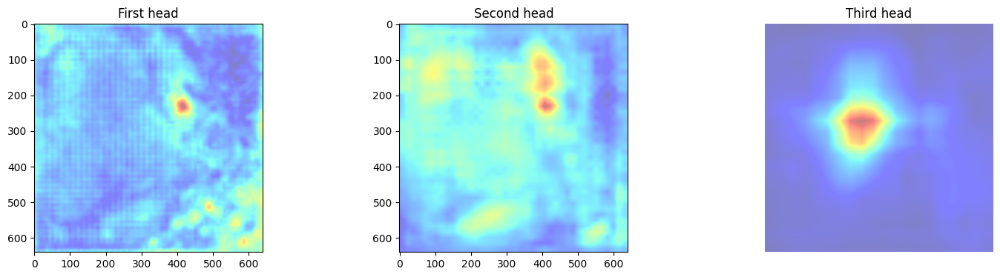

In [ ]:
fig_original_interpol

Карты интерполяции подтверждают и укрепляют наблюдения — каждая из трёх голов локализуется на различных областях. Это значит, что небольшой шум (среднее 0, диспесрия 0.1) уже сильно сбивает модель.

# **Итоги**

В ходе исследования мы установили, что даже слабый шум на изображении, возникающий, например, из-за помех при передаче данных, может существенно повлиять на точность прогнозов модели. Это подчеркивает важность предварительной обработки данных и устойчивости моделей к шумам.

Спасибо за ваше внимание! 🤗 Надеюсь, представленный материал окажется полезным в ваших проектах. Вы можете поэкспериментировать с другими изображениями, чтобы выявить еще больше закономерностей.

Присоединяйтесь к [каналу в телеграм](https://t.me/jdata_blog), чтобы видеть новые туториалы! Также приглашаю пройти мой [rурс](https://stepik.org/a/198640) по explainable AI и, конечно, буду рада видеть в профессиональной сети через[LinkedIn](https://www.linkedin.com/in/sabrina-sadiekh-35181a286/).

Успешных вам проектов!
Ваш Дата-автор!